In [6]:
import os, sys, glob
import cv2
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm

In [127]:
# Read Frames
path_frames = "robot_parcours_1.avi"

def Video_to_Frames(Video_file):
    """
    Video_file: path to video
    it returns a list which contains frames as narray format
    """
    frames = []
    cap = cv2.VideoCapture(Video_file)  
    
    while True:
        ret, frame = cap.read()  
        if not ret:
            break # Reached end of video
        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        frames.append(frame)
        
    cap.release()
    return frames

frames = Video_to_Frames(path_frames)

In [128]:
frames[0].shape

(480, 720, 3)

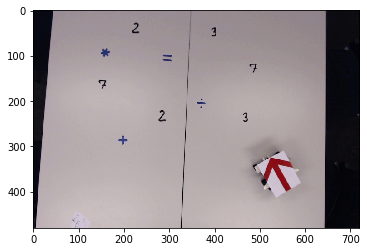

In [129]:
plt.imshow(frames[0])

In [130]:
from skimage.color import rgb2gray
frame_gray = rgb2gray(frames[0])

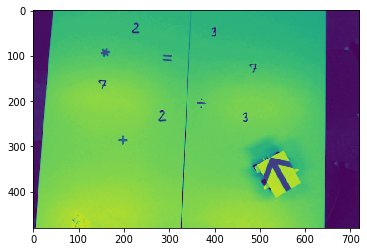

In [131]:
plt.imshow(frame_gray)

Text(0, 0.5, 'Number of pixels')

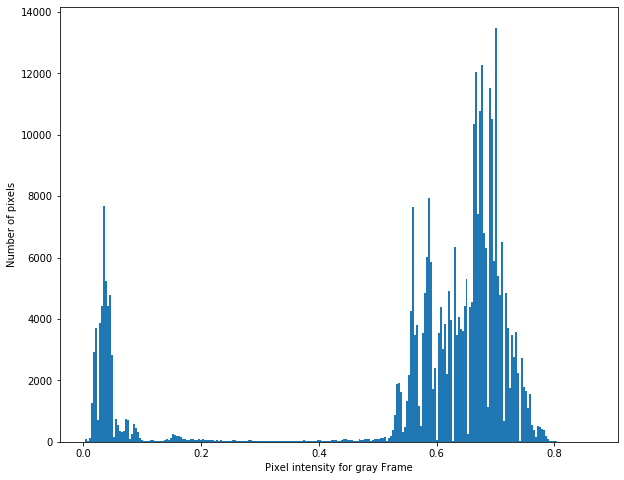

In [132]:
plt.figure(figsize=(10, 8))
plt.hist(frame_gray.ravel(), bins = 256)
plt.xlabel('Pixel intensity for gray Frame')
plt.ylabel('Number of pixels')

Text(0, 0.5, 'Number of pixels')

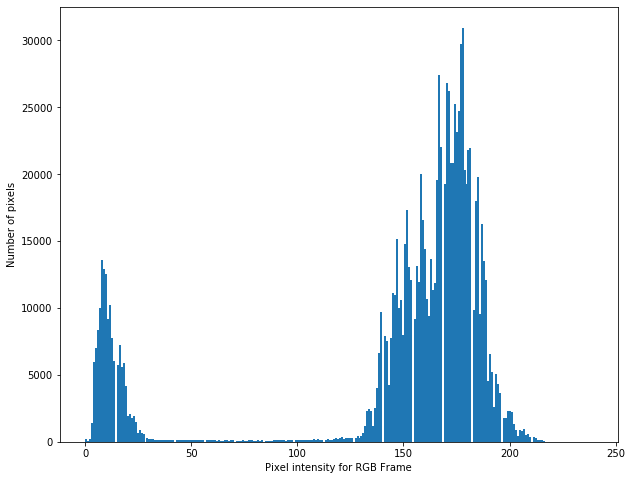

In [133]:
plt.figure(figsize=(10, 8))
plt.hist(frames[0].ravel(), bins = 256)
plt.xlabel('Pixel intensity for RGB Frame')
plt.ylabel('Number of pixels')

In [134]:
grayscale = frame_gray > 0.75
frame = frames[0] > 130

In [135]:
grayscale

array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]])

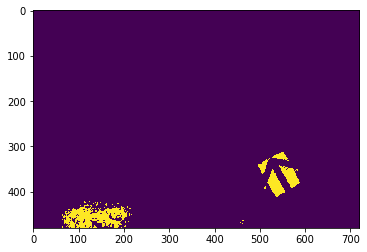

In [136]:
plt.imshow(grayscale)

/Users/user/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


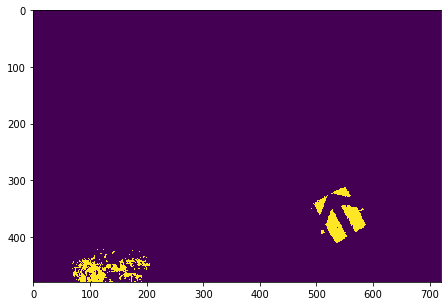

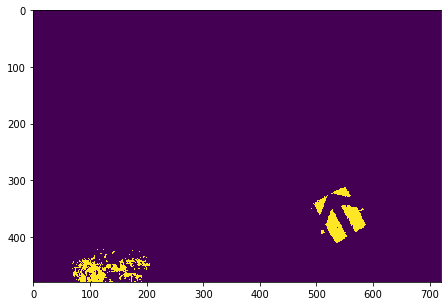

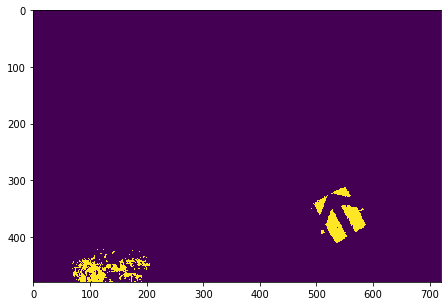

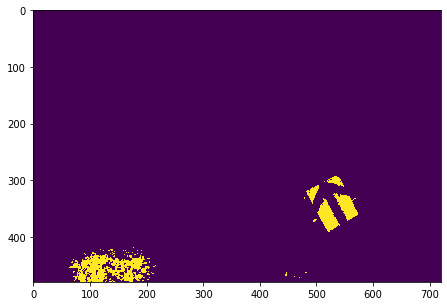

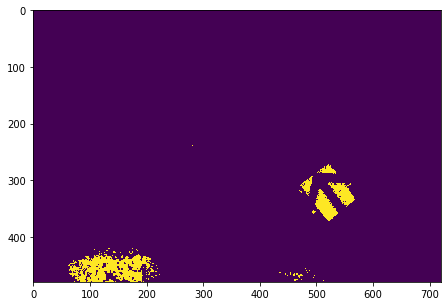

...

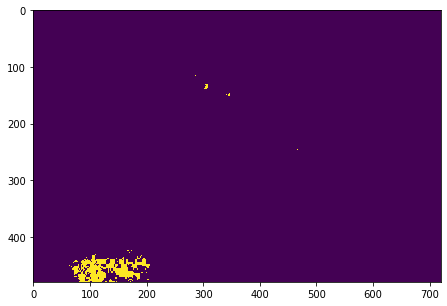

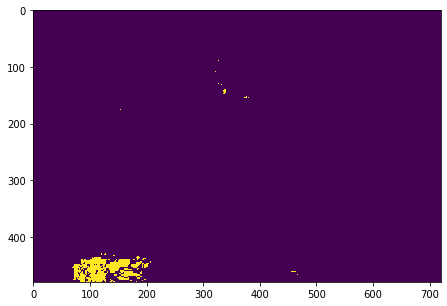

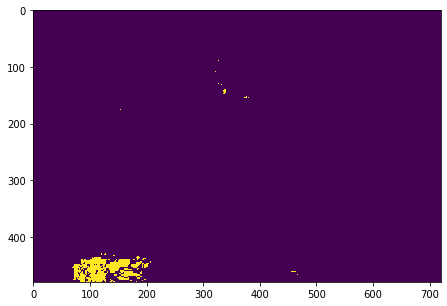

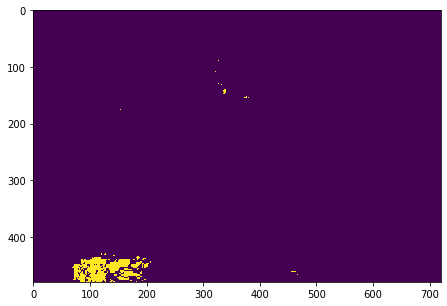

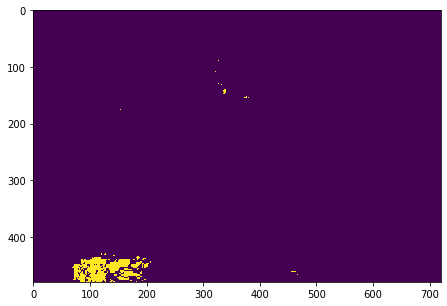

In [87]:
for i in range(0, len(frames)):
    plt.figure(figsize=(10, 5))
    frame = rgb2gray(frames[i])
    plt.imshow(frame> 0.75)

In [ ]:
# We need a method a find a robust threshold for the robot

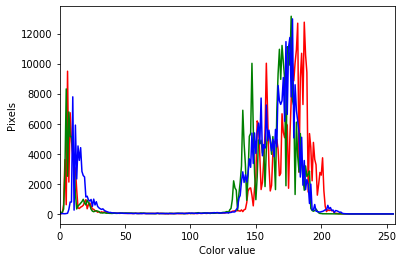

In [137]:
# tuple to select colors of each channel line
colors = ("r", "g", "b")
channel_ids = (0, 1, 2)
img = frames[5]

# create the histogram plot, with three lines, one for
# each color
plt.xlim([0, 256])
for channel_id, c in zip(channel_ids, colors):
    histogram, bin_edges = np.histogram(
        img[:, :, channel_id], bins = 256, range=(0, 256)
    )
    plt.plot(bin_edges[0:-1], histogram, color=c)

plt.xlabel("Color value")
plt.ylabel("Pixels")

plt.show()

In [138]:
#Removing Noise
from skimage.filters import *
clean_frame = gaussian(grayscale, sigma = 1)

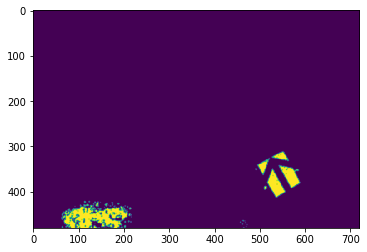

In [139]:
plt.imshow(clean_frame)

In [140]:
#Defining lower, higher range of each color from HSV Color space
dic = {"lower_blue_white" : np.array([0,10,0]),
        "upper_blue_white" : np.array([20,255,255]),
        "lower_blue" : np.array([0,30,0]),
        "upper_blue" : np.array([20,255,255]),
        "lower_black": np.array([0,0,0]),
        "upper_black": np.array([180,255,30]),
        "lower_green"  : np.array([20,10,0]),
        "upper_green"  : np.array([80,255,255]),
        "lower_yellow" : np.array([80,30,0]),
        "upper_yellow" : np.array([100,255,255]),
        "lower_orange" : np.array([100,182,0]),
        "upper_orange" : np.array([110,255,255]),
        "lower_red" : np.array([110,150,0]),
        "upper_red" : np.array([120,255,255]),
        "lower_pink" : np.array([125,100,0]),
        "upper_pink" : np.array([250,255,255])}

In [141]:
def hsv_detection(image, lower_color, upper_color):  
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    mask1 = cv2.inRange(hsv, lower_color, upper_color)
    res = cv2.bitwise_and(image, image, mask = mask1)
    return res

In [142]:
def enhance_contrast(src, alpha = 1.0, beta = 0):
    """
    src: input image
    Parameters α>0 and β are often called the gain and bias parameters; 
    output : img with same shape of the input output = alpha * src + beta
    """
    new_img = np.zeros(src.shape, src.dtype)
    #print(new_img.shape)
    for y in range(src.shape[0]):
        for x in range(src.shape[1]):
            for c in range(src.shape[2]):
                new_img[y, x, c] = np.clip(alpha * img[y, x, c] + beta, 0, 255)
    return new_img

In [143]:
import skimage.io

img1 = skimage.io.imread("./robot_parcours_1_frames/frame0.jpg")
img1 = enhance_contrast(img1)
new_img = cv2.cvtColor(img1, cv2.COLOR_BGR2HSV)
red = hsv_detection(new_img, dic["lower_red"], dic["upper_red"])

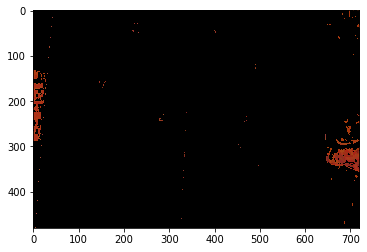

In [145]:
plt.imshow(red)

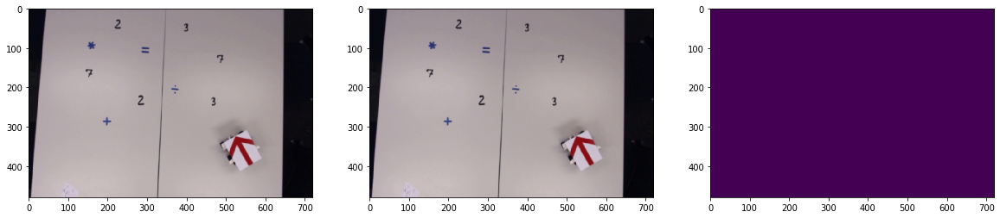

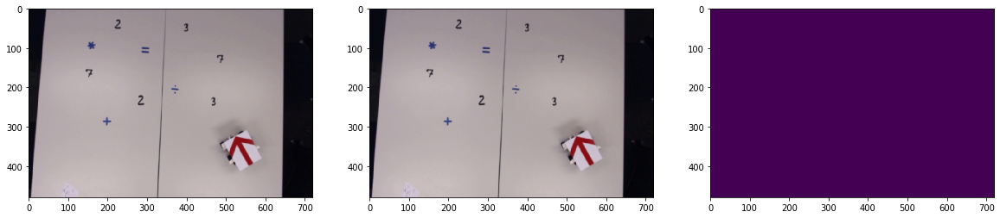

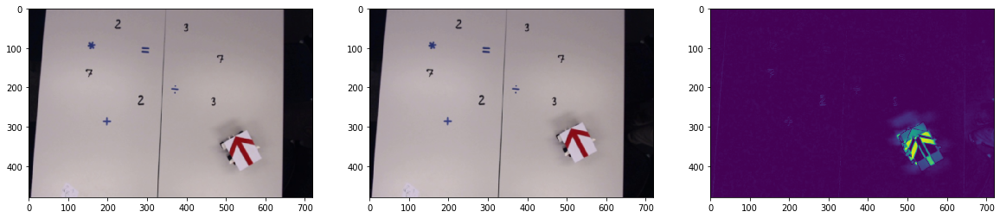

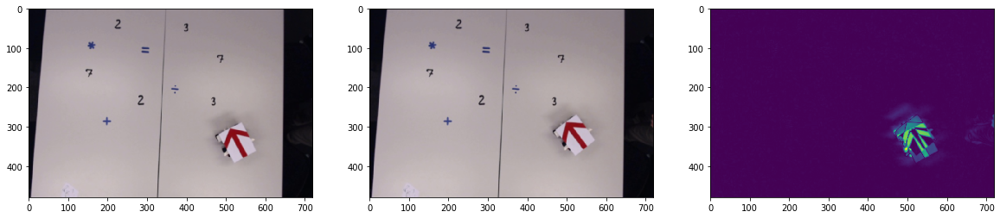

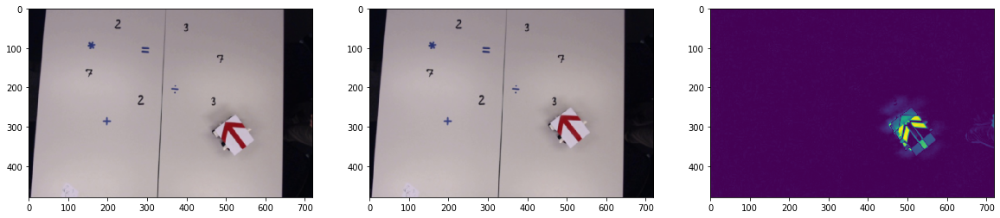

...

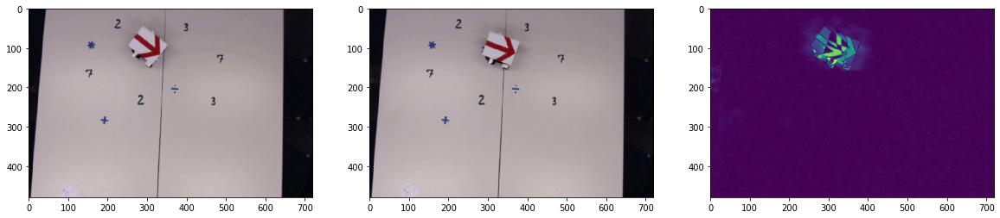

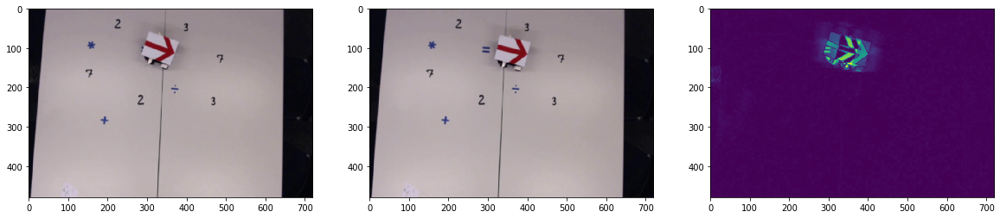

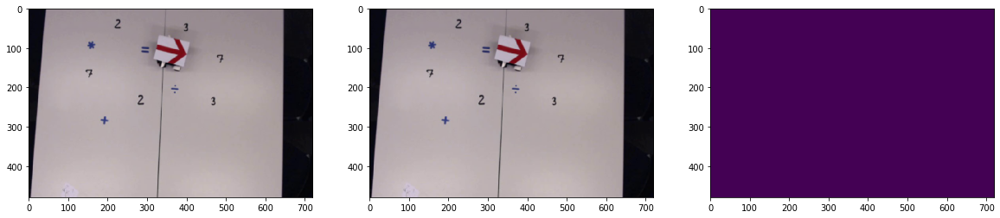

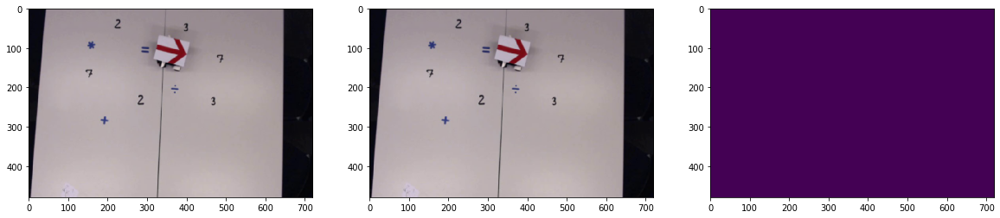

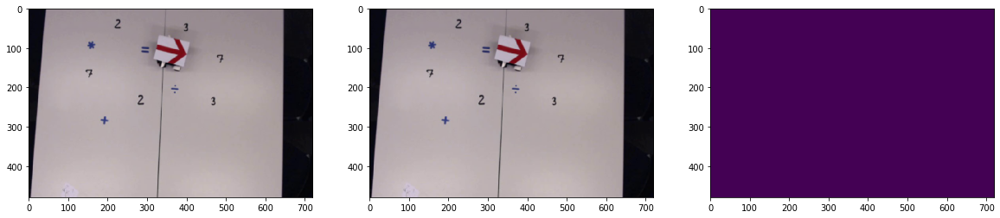

In [150]:
frame_changes = []
for i in range(1, len(frames)):
    plt.figure(figsize=(20, 5))
    plt.subplot(1, 3, 1)
    frame1 = gaussian(frames[i - 1], sigma=1, multichannel=True)
    plt.imshow(frame1)

    plt.subplot(1, 3, 2)
    frame2 = gaussian(frames[i], sigma=1, multichannel=True)
    plt.imshow(frame2)
    
    plt.subplot(1, 3, 3)
    changes = np.linalg.norm(frame1 - frame2, axis=2)
    plt.imshow(changes)
    
    frame_changes.append(changes)
    
    plt.show()

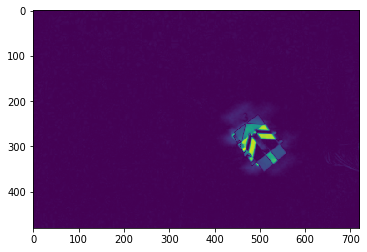

In [149]:
plt.imshow(frame_changes[5])

In [166]:
def detect_labels(src, thresh):
    """
    src: image after performing noise cancelling and masking
    returns -> * label_image: image containing only interesting objects
               * b : number of interesting objects in the image
    """
    gray = skimage.color.rgb2gray(src)
    gray[gray > thresh] = 255
    label_image, b = skimage.measure.label(gray, connectivity=1, return_num=True)
    return label_image, b

In [275]:
from skimage.morphology import closing, square
from skimage.segmentation import clear_border

# In this case, we will be using Gausiann bluring method alread built-in SkImage
# Blurring Sigma : a tuple defining the sigma to use in y- and x-direction, (sigma, sigma)
k = 2

def preprocessing(img, k = 1, t = 0.5):
    """
    img: source image
    k : blurring Sigma a tuple defining the sigma to use in y- and x-direction, (sigma, sigma)
    t : thresholding value which should be a float in the closed range [0.0, 1.0].
    return and RGB image (N * D*  3) with less noise and m
    """
    # blur and grayscale before thresholding
    gray = skimage.color.rgb2gray(img)
    blur = skimage.filters.gaussian(gray, sigma = k, multichannel=True)
    
    #t = skimage.filters.threshold_otsu(blur)
    #The fixed-level thresholding is performed using numpy comparison operators.
    
    #Apply closing : The morphological closing on an image is defined as a dilation followed by an erosion. 
    #Closing can remove small dark spots (i.e. “pepper”) and connect small bright cracks. 
    #This tends to “close” up (dark) gaps between (bright) features.
    #mask = closing(blur < t, square(5))
    mask = blur < t
    
    # remove artifacts connected to image border
    cleared = clear_border(mask)
    
    # use the mask to select the "interesting" part of the image
    sel = np.zeros_like(img)
    sel[cleared] = img[cleared]
    return cleared, sel

In [281]:
new_mask, new_img = preprocessing(frames[3])

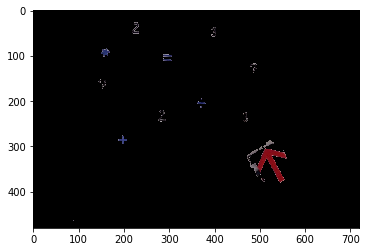

In [285]:
plt.imshow(new_img)

In [297]:
labels, nbr = detect_labels(new_img, 0.05)

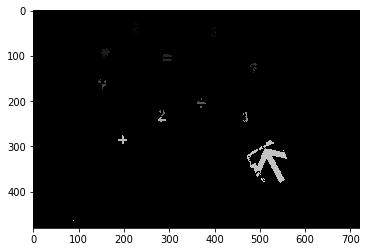

In [298]:
plt.imshow(labels, cmap="gray")

In [290]:
nbr

67

In [299]:
image = frames[2]

In [301]:
grayscale = rgb2gray(image) * 255

In [303]:
from skimage.feature import canny
from skimage.morphology import closing, square, binary_erosion, binary_dilation, binary_opening, binary_closing, disk, remove_small_holes

In [304]:
edges = canny(grayscale/255.)

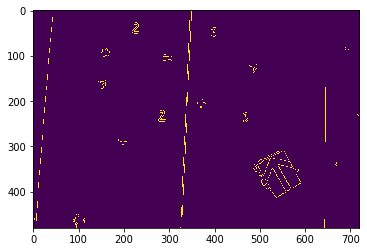

In [305]:
plt.imshow(edges)